# Loading datasets into a dataframe

last update: 2025-12-24

In [0]:
storage_account = "lab94290"  
container = "airbnb"

# Reading airbnb data from Parquet.

In [0]:
aibnb_sas_token="sp=rle&st=2025-12-24T17:37:04Z&se=2026-02-28T01:52:04Z&spr=https&sv=2024-11-04&sr=c&sig=a0lx%2BS6PuS%2FvJ9Tbt4NKdCJHLE9d1Y1D6vpE1WKFQtk%3D"
sas_token = aibnb_sas_token
sas_token = sas_token.lstrip('?')
spark.conf.set(f"fs.azure.account.auth.type.{storage_account}.dfs.core.windows.net", "SAS")
spark.conf.set(f"fs.azure.sas.token.provider.type.{storage_account}.dfs.core.windows.net", "org.apache.hadoop.fs.azurebfs.sas.FixedSASTokenProvider")
spark.conf.set(f"fs.azure.sas.fixed.token.{storage_account}.dfs.core.windows.net", sas_token)

In [0]:
path = f"abfss://{container}@{storage_account}.dfs.core.windows.net/airbnb_1_12_parquet"

airbnb = spark.read.parquet(path)
display(airbnb.limit(5))

name price image description category availability discount reviews ratings seller_info breadcrumbs location lat long guests pets_allowed description_items category_rating house_rules details highlights arrangement_details amenities images available_dates url final_url listing_title property_id listing_name location_details description_by_sections description_html location_details_html is_supperhost host_number_of_reviews host_rating hosts_year host_response_rate is_guest_favorite travel_details pricing_details total_price currency cancellation_policy property_number_of_reviews country postcode_map_url host_image host_details Rental unit in Broadbeach · ★4.96 · 2 bedrooms · 2 beds · 1 bath 238 https://a0.muscache.com/pictures/50ddeaed-5302-4d0c-8200-163b2cddd071.jpg Our exceptionally stylish two bedroom, one bathroom LUXURY holiday apartment is located in the ORACLE T2, right in the heart of beautiful Broadbeach! Every corner of this gorgeous apartment overflows with style, luxury and thoughtful touches. Relax on the ocean facing balcony located directly above the manicured garden terrace and take in the relaxing views and sea breezes. This property is all class and guaranteed to satisfy even the fussiest Airbnb guest!The spaceThe photos speak for themselves. They are a true, accurate and up to date representation of our immaculately presented, squeaky clean, apartment. The furnishings are practical and comfortable and the linen and bedding are soft and luxurious. The master king bedroom opens out onto the large balcony. The second bedroom is a small internal room with a comfortable high quality queen sized bed. The second bedroom does not have a window. Each bedroom has an internal sliding door which provides access to the two way bathroom. Our apartment has been styled with a relaxing holiday in mind.Guest accessPoolSpaGymSauna and steam roomBBQ and entertaining areasGardensSecure off street parking for ONE vehicleAccess to facilities is not guaranteed and may be interrupted by routine and unexpected maintenance schedules.Other things to noteThis property accommodates up to FOUR people only. Children aged two and older are included in the four people rule. No exceptions. Infants UNDER the age of two are very welcome at our place and may stay at no additional charge however we do not provide linen or bedding. Let us know if you would like the link to a local business who hires out baby equipment (travel cots, strollers, high chairs).CHECK IN Available between 3pm and 9pm.Self check in is NOT available at this property. After hours check ins are NOT available. A 3pm check in is not guaranteed and depends on cleaning schedules. CHECK IN APPOINTMENTOur lovely host welcomes you in person on arrival. The booking guest is required to make contact with us via the booking message thread prior to their arrival day to arrange a check in time. A host will not be onsite to meet you unless you have scheduled a check in time. We always do our best to fit in with your travel schedule. IMPORTANTKeys and security fobs will only be issued to the person who made the booking. ID will be required. This is not negotiable. Please read the HOUSE RULES and CANCELLATION POLICY prior to booking our place. We recommend taking out travel insurance to cover any losses which may occur if you need to cancel your booking for an unforeseen reason. NO SMOKING - smoking is NOT permitted anywhere at this complex.CHECK IN / CHECK OUT - NOT AVAILABLE* Christmas Day* New Years Day * Easter SundayEARLY CHECK IN - We will always accommodate an early check in if our place is available. CHECK OUT by 11am - Late check outs are not available and hold up our cleaning team. WHAT WE INCLUDE IN OUR STARTER PACKOur starter pack is designed to help get you started on your holiday and may not last the entire trip. If you are with us for more than two nights, you may need to re stock items at the local supermarket. Woolworths supermarket is located right next door for any additi

# Read Booking.com

In [0]:
booking_sas_token= "sp=rle&st=2025-12-24T17:40:17Z&se=2026-03-28T00:55:17Z&spr=https&sv=2024-11-04&sr=c&sig=MDPp34fAOi%2B4oUejQ8HnQ4PblcvEe8dCpwzLQgBCsPk%3D"
sas_token = booking_sas_token
sas_token = sas_token.lstrip('?')

fname = "booking_1_9.parquet"
# 2) tell ABFS to use SAS for the account and give the fixed token provider
acct = storage_account  # e.g. "lab94290"
spark.conf.set(f"fs.azure.account.auth.type.{acct}.dfs.core.windows.net", "SAS")
spark.conf.set(f"fs.azure.sas.token.provider.type.{acct}.dfs.core.windows.net",
               "org.apache.hadoop.fs.azurebfs.sas.FixedSASTokenProvider")
spark.conf.set(f"fs.azure.sas.fixed.token.{acct}.dfs.core.windows.net", sas_token)

path = f"abfss://{container}@{acct}.dfs.core.windows.net/{fname}"

In [0]:
# read the df from the parquet, just to show we can
booking = spark.read.parquet('abfss://booking@lab94290.dfs.core.windows.net/booking_1_9.parquet')
display(booking.limit(5))

availability city coordinates country description fine_print hotel_id house_rules images location managed_by manager_language_spoken manager_score metro_railway_access most_popular_facilities number_of_reviews popular_facilities property_highlights property_information property_surroundings review_score reviews_scores title top_reviews url List(List(1 king bed, null, 2, One-Bedroom Apartment)) Vrindāvan List(27.5737379354334, 77.6546632927292) India Featuring a garden, Mero vrindavan Luxury aavas features accommodations in Vrindāvan. This property offers access to a terrace, free private parking, and free Wifi.

This apartment will provide guests with 1 bedroom, a flat-screen TV, and air conditioning. The apartment also includes 1 bathroom.

Bharatpur Train Station is 31 miles from the apartment, while Mathura Train Station is 9 miles from the property. Agra Airport is 41 miles away. This property does not accommodate bachelor(ette) or similar parties. 12919785 List(List(From 12:00 PM to 11:00 PM You need to let the property know what time you'll be arriving in advance., Check-in), List(From 8:00 AM to 11:00 AM, Check-out), List(Cancellation and prepayment policies vary according to accommodation type. Enter your stay dates and check the conditions of your selected option., Cancellation/ prepayment), List(Child policies Children of all ages are welcome. To see correct prices and occupancy info, add the number and ages of children in your group to your search. Crib and extra bed policies Cribs and extra beds aren't available at this property., Children & Beds), List(There's no age requirement for check-in, No age restriction), List(Smoking is not allowed., Smoking), List(Parties/events are not allowed, Parties), List(Free! Pets are allowed. No extra charges., Pets)) List(https://cf.bstatic.com/xdata/images/hotel/max200/603653035.jpg?k=389f38be85031d2743f99b2fa6dfb9057557c739a921c74399ef5a0ef2d13edd&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653144.jpg?k=f363b0b79f3a6cd34c0deea79fe914db2e9ff4de19718324c9984c473167f21c&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653114.jpg?k=d1db0a18879b81d88ced90184f7baf3d69a655690cb52845fcc66c4734ab1135&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653103.jpg?k=b4196fc9b98950240db78d9648f8c8f88cedad19a0421c8c2c09a056bda0b214&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653086.jpg?k=c947befcb2f56d906e33488fe3bf63dc93a7902d037e2a8e36b8f87dc782261b&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653112.jpg?k=5e4ac49a4cd1ebfceb59314e1c81e80b115250e34a7f8f2784998ea924831857&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653083.jpg?k=ea5c5f07e22411dbe5a8efe3b38d2186907f87c4d6a7b59e4225902920d7e57b&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653080.jpg?k=1a8ad31134e2089042228673eb427c58b040904707917123325d70b8e70bbeb4&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653068.jpg?k=e398c11b34fa5dc518938f033b9234c55b024a0857fa0ff7954399ed1968975f&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653075.jpg?k=d64617957b2a3a2aa8038da09e33c7502bad000c06fea6f2580d4d4ec61931d6&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653077.jpg?k=6e8a8110d71315753c82807a0983eff2cd53c2073abd818f8cec72e646fb2d87&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653088.jpg?k=b2410bbebbf7e7747d63e1eb371676d2b7c142886e49d764bb2eca8ff22ad1b4&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653093.jpg?k=01e8307caea449129657723dd6674cc021f583ec1df15e1bd56aac26ddbee099&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653098.jpg?k=2941324ca574eccb9e3d0eea87e5d46d8151d66b6753ff4fcefd4cdb53203ff7&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653107.jpg?k=2030818f224ee99b97e139e3f0bc79778dd21f32204ae3618fdb13ae7dbac145&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653119.jpg?k=c46bd7884d30ab675cb06330515457f6d56f47bae3ffbc616e449913cae680f6&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653

## Cleaning and preprocessing of Airbnb data

In [0]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from pyspark.sql.functions import col, to_date, row_number, desc, split, regexp_replace, array_max, count, when, lit
from pyspark.sql.window import Window

# ==========================================
# 0. SCHEMA & TYPE CASTING
# ==========================================
print("Step 0: Schema & Type Checking")
print(f"Total Raw Count: {airbnb.count()}")

# Print initial schema 
airbnb.printSchema()

Step 0: Schema & Type Checking
Total Raw Count: 2098880
root
 |-- name: string (nullable = true)
 |-- price: string (nullable = true)
 |-- image: string (nullable = true)
 |-- description: string (nullable = true)
 |-- category: string (nullable = true)
 |-- availability: string (nullable = true)
 |-- discount: string (nullable = true)
 |-- reviews: string (nullable = true)
 |-- ratings: string (nullable = true)
 |-- seller_info: string (nullable = true)
 |-- breadcrumbs: string (nullable = true)
 |-- location: string (nullable = true)
 |-- lat: string (nullable = true)
 |-- long: string (nullable = true)
 |-- guests: string (nullable = true)
 |-- pets_allowed: string (nullable = true)
 |-- description_items: string (nullable = true)
 |-- category_rating: string (nullable = true)
 |-- house_rules: string (nullable = true)
 |-- details: string (nullable = true)
 |-- highlights: string (nullable = true)
 |-- arrangement_details: string (nullable = true)
 |-- amenities: string (nullable =

In [0]:
from pyspark.sql.functions import col, regexp_replace

print("--- Step 0: Casting & Null Check ---")

clean_cols = [
    "price", 
    "total_price", 
    "host_number_of_reviews", 
    "property_number_of_reviews", 
    "guests",
    "ratings" 
]

null_report = {}

for c in clean_cols:
    # regex: [^0-9.] -> Replace non-digits/non-dots with empty string
    airbnb = airbnb.withColumn(f"{c}_temp", regexp_replace(col(c), r"[^0-9.]", "").cast("double"))
    
    # B. Check for Data Loss (Null Injection)
    # Logic: If original was NOT null, but temp IS null -> The cast failed.
    failed_casts = airbnb.filter(col(c).isNotNull() & col(f"{c}_temp").isNull()).count()
    null_report[c] = failed_casts
    
    airbnb = airbnb.drop(c).withColumnRenamed(f"{c}_temp", c)

# 2. CLEANING COORDINATES
coord_cols = ["lat", "long"]

for c in coord_cols:
    # A. Cast to temp
    airbnb = airbnb.withColumn(f"{c}_temp", col(c).cast("double"))
    
    # B. Check for Data Loss
    failed_casts = airbnb.filter(col(c).isNotNull() & col(f"{c}_temp").isNull()).count()
    null_report[c] = failed_casts
    
    airbnb = airbnb.drop(c).withColumnRenamed(f"{c}_temp", c)

print("\nDATA LOSS CHECK (Values that turned to NULL during cast):")
print("-" * 50)
has_errors = False
for col_name, loss_count in null_report.items():
    if loss_count > 0:
        print(f"{col_name}: {loss_count} values failed to cast.")
        has_errors = True
    else:
        print(f"{col_name}: 0 failures")

if not has_errors:
    print("-" * 50)
    print("All columns casted without losing any data.")

# Final peek
airbnb.select("price", "guests", "lat", "long").show(5)

--- Step 0: Casting & Null Check ---

DATA LOSS CHECK (Values that turned to NULL during cast):
--------------------------------------------------
price: 0 failures
total_price: 0 failures
host_number_of_reviews: 0 failures
property_number_of_reviews: 0 failures
guests: 0 failures
ratings: 0 failures
lat: 0 failures
long: 0 failures
--------------------------------------------------
All columns casted without losing any data.
+-------+------+---------+---------+
|  price|guests|      lat|     long|
+-------+------+---------+---------+
|  238.0|   4.0| -28.0307| 153.4319|
|   NULL|   5.0|-38.70057|146.46478|
|   NULL|   4.0|  45.6415|  25.5874|
|15118.0|   6.0|  37.0023|  25.1394|
|  174.0|  11.0| 28.11846|-15.62416|
+-------+------+---------+---------+
only showing top 5 rows




--- Step 1: Analyze Duplicates per Property ---


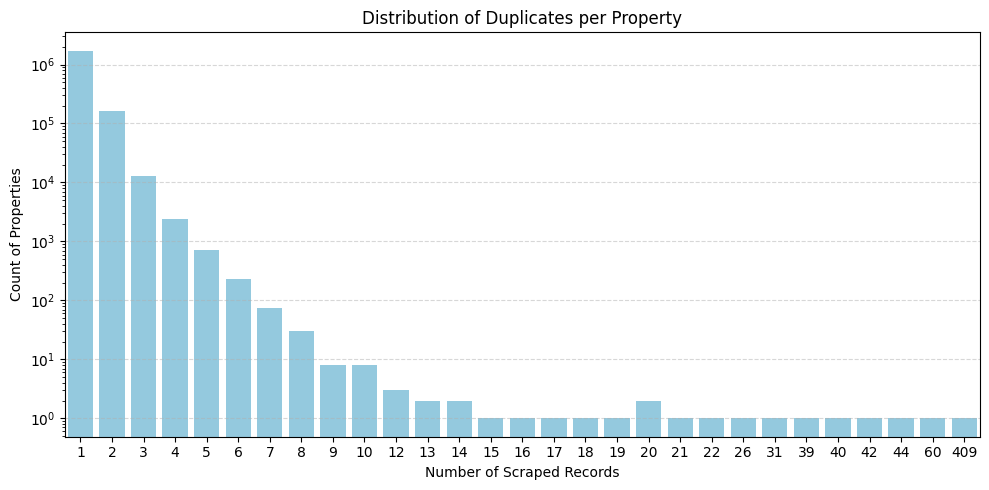

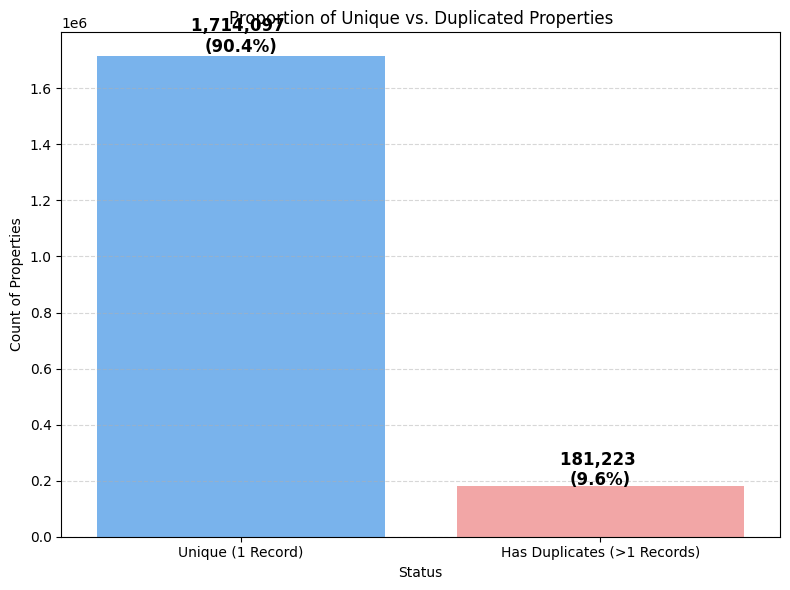


--- Step 2: Removing Duplicates ---
Original Count:     2098880
Deduplicated Count: 1895320


In [0]:
# ==========================================
# 1. DUPLICATE ANALYSIS (EDA)
# ==========================================
print("\n--- Step 1: Analyze Duplicates per Property ---")

# A. Count duplicates
prop_counts = airbnb.groupBy("property_id").count().withColumnRenamed("count", "num_records")

# B. Distribution for Histogram 
dist_counts = prop_counts.groupBy("num_records").count().orderBy("num_records")
pdf_dist = dist_counts.toPandas()

# C. Plotting
plt.figure(figsize=(10, 5))
sns.barplot(data=pdf_dist, x='num_records', y='count', color='skyblue')
plt.title('Distribution of Duplicates per Property')
plt.xlabel('Number of Scraped Records')
plt.ylabel('Count of Properties')
plt.yscale('log') 
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# 1. Categorize: If num_records == 1 -> 'Unique', Else -> 'Has Duplicates'
# We use the 'prop_counts' dataframe created in the previous step
binary_counts = prop_counts.withColumn(
    "duplicate_status", 
    when(col("num_records") == 1, "Unique (1 Record)")
    .otherwise("Has Duplicates (>1 Records)")
)

# 2. Group by this new status to get the totals
status_agg = binary_counts.groupBy("duplicate_status").count().toPandas()

# 3. Calculate Percentages for the labels
total_props = status_agg['count'].sum()
status_agg['percentage'] = (status_agg['count'] / total_props) * 100

# 4. Plotting
plt.figure(figsize=(8, 6))
# Using a custom palette: Green for good (Unique), Orange for warning (Duplicates)
ax = sns.barplot(data=status_agg, x='duplicate_status', y='count', palette=['#66b3ff', '#ff9999'])

plt.title('Proportion of Unique vs. Duplicated Properties')
plt.xlabel('Status')
plt.ylabel('Count of Properties')
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Add percentage labels on top of the bars
for i, p in enumerate(ax.patches):
    # Calculate height of bar
    height = p.get_height()
    # Get the percentage for this bar
    pct = status_agg.iloc[i]['percentage']
    # Annotate
    ax.text(p.get_x() + p.get_width() / 2., height + (height * 0.01), 
            f'{int(height):,} \n({pct:.1f}%)', 
            ha="center", fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


# ==========================================
# 2. DEDUPLICATION LOGIC
# ==========================================
print("\n--- Step 2: Removing Duplicates ---")

# 1. Clean up the dates string 
df_parsed = airbnb.withColumn(
    "dates_clean_str", 
    regexp_replace(col("available_dates"), r'[\[\]"]', "")
)

# 2. Convert to array and find the maximum date in the future
df_dates = df_parsed.withColumn(
    "dates_array", 
    split(col("dates_clean_str"), ",")
).withColumn(
    "max_future_date",
    to_date(array_max(col("dates_array")), "yyyy-MM-dd")
)

# 3. Window Function: Partition by Property, Order by Max Date Descending
windowSpec = Window.partitionBy("property_id").orderBy(desc("max_future_date"))

# 4. Filter to keep only Row 1
airbnb_deduped = df_dates.withColumn("row_num", row_number().over(windowSpec)) \
                         .filter(col("row_num") == 1) \
                         .drop("row_num", "dates_clean_str", "dates_array", "max_future_date")

print(f"Original Count:     {airbnb.count()}")
print(f"Deduplicated Count: {airbnb_deduped.count()}")

In the previous section we first cleaned and casted columns like `price` and `reviews` thet originally where strings and we want them to be double or float for our further analysis. A "Data Loss Check" runs simultaneously to ensure valid data isn't accidentally turned into `null` during this conversion.

Once the schema is fixed, we addressed data redundancy. We visualized the distribution of duplicates to understand whether duplicates are rare or common. Finally, we implemented a deduplication logic using a Window function: we group by `property_id` and retain the record with the furthest `max_future_date`, assuming this represents the most recent scrape. We thought that this would make the most sense since for our future model and analysis we want the most updated ratings and reviews, so we took the last duplicate scraped.


--- Step 3: Null Value Analysis (Location & ID) ---
Total Rows: 2098880
------------------------------
property_id: 409 nulls (0.02%)
lat: 231 nulls (0.01%)
long: 231 nulls (0.01%)


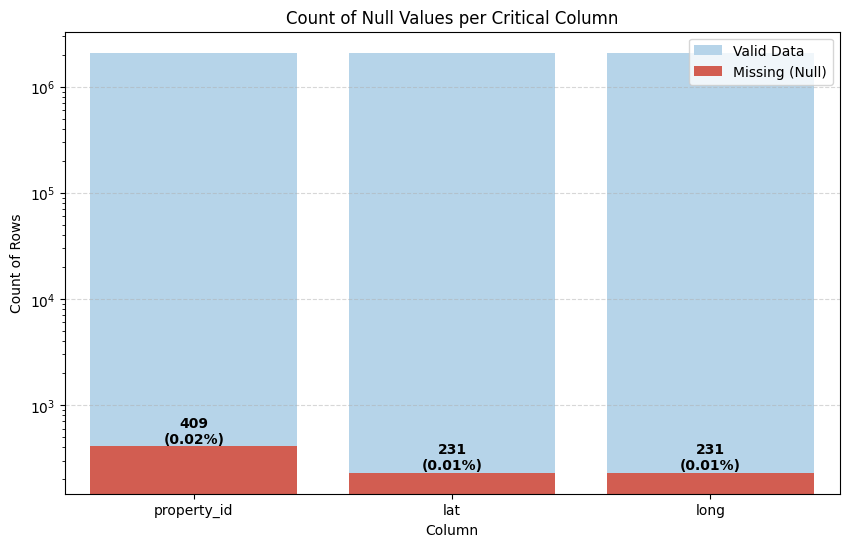


--- NULL ANALYSIS REPORT ---
Total Rows Checked: 2,098,880
Found 409 rows with missing 'property_id'.
Found 231 rows with missing coordinates (lat/long).


In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql.functions import col, count, when

print("--- Step 3: Null Value Analysis (Location & ID) ---")

check_cols = ['property_id', 'lat', 'long']

# 2. Calculate Null Counts & Percentages
null_exprs = [count(when(col(c).isNull(), c)).alias(c) for c in check_cols]
total_rows = airbnb.count()

# Get the counts as a dictionary
null_counts = airbnb.select(null_exprs).first().asDict()

# 3. Prepare Data for Plotting
stats = []
for c in check_cols:
    missing = null_counts[c]
    present = total_rows - missing
    pct_missing = (missing / total_rows) * 100
    stats.append({
        'Column': c, 
        'Missing (Null)': missing, 
        'Present (Valid)': present, 
        'Pct_Missing': pct_missing
    })

df_null_stats = pd.DataFrame(stats)

print(f"Total Rows: {total_rows}")
print("-" * 30)
for index, row in df_null_stats.iterrows():
    print(f"{row['Column']}: {row['Missing (Null)']} nulls ({row['Pct_Missing']:.2f}%)")

# 4. Visualization: Stacked Bar Chart (Missing vs. Present)
# This is better than a simple histogram because it shows the proportion visually
plt.figure(figsize=(10, 6))

# Plot 'Total' (Background bar - looks like "Present" after we overlay missing)
sns.barplot(data=df_null_stats, x='Column', y='Present (Valid)', color='#AED6F1', label='Valid Data')

# Plot 'Missing' (Foreground bar - stacked on top effectively if we flipped logic, 
# but here we plot Missing as a separate red bar to highlight it)
sns.barplot(data=df_null_stats, x='Column', y='Missing (Null)', color='#E74C3C', label='Missing (Null)')

plt.title('Count of Null Values per Critical Column')
plt.ylabel('Count of Rows')
plt.yscale('log') 
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Add text labels
for i, row in df_null_stats.iterrows():
    if row['Missing (Null)'] > 0:
        plt.text(i, row['Missing (Null)'], 
                 f"{int(row['Missing (Null)']):,}\n({row['Pct_Missing']:.2f}%)", 
                 ha='center', va='bottom', fontweight='bold', color='black')

plt.show()

# --- DECISION LOGIC (UPDATED) ---
print("\n--- NULL ANALYSIS REPORT ---")
print(f"Total Rows Checked: {total_rows:,}")

# Property ID Check
if null_counts['property_id'] > 0:
    print(f"Found {null_counts['property_id']:,} rows with missing 'property_id'.")
else:
    print("All rows have a valid 'property_id'.")

# Coordinates Check
missing_coords = max(null_counts['lat'], null_counts['long'])
if missing_coords > 0:
    print(f"Found {missing_coords:,} rows with missing coordinates (lat/long).")
else:
    print("All rows have valid coordinates.")


In [0]:
# Drop missing critical info 
airbnb_clean = airbnb_deduped.dropna(subset=["lat", "long", "property_id"])

Our analysis revealed that rows containing missing values in critical columns (property_id, lat, long) constitute a negligible fraction of the dataset (approximately 0.01% to 0.02%). Since property_id is required to uniquely identify listings and accurate location coordinates are essential for our planned geospatial analysis and models, we cannot utilize records missing this information. Therefore, we have decided to drop these rows to ensure data integrity without significantly reducing our dataset size.


In [0]:
from pyspark.sql.functions import col

print("--- Price Issue Analysis ---")

null_price_df = airbnb_deduped.filter(col("price").isNull())
low_price_df = airbnb_deduped.filter((col("price").isNotNull()) & (col("price") < 10))

null_count = null_price_df.count()
low_count = low_price_df.count()

total_issues = null_count + low_count
total_rows = airbnb_deduped.count()

# 3. PRINT STATISTICS
print(f"Total Rows: {total_rows}")
print(f"Rows with NULL Price: {null_count}")
print(f"Rows with Price < $10: {low_count}")
print(f"Total Affected: {total_issues} ({total_issues/total_rows:.2%})")

--- Price Issue Analysis ---
Total Rows: 1895320
Rows with NULL Price: 560941
Rows with Price < $10: 11115
Total Affected: 572056 (30.18%)


Visualizing Price Data Quality


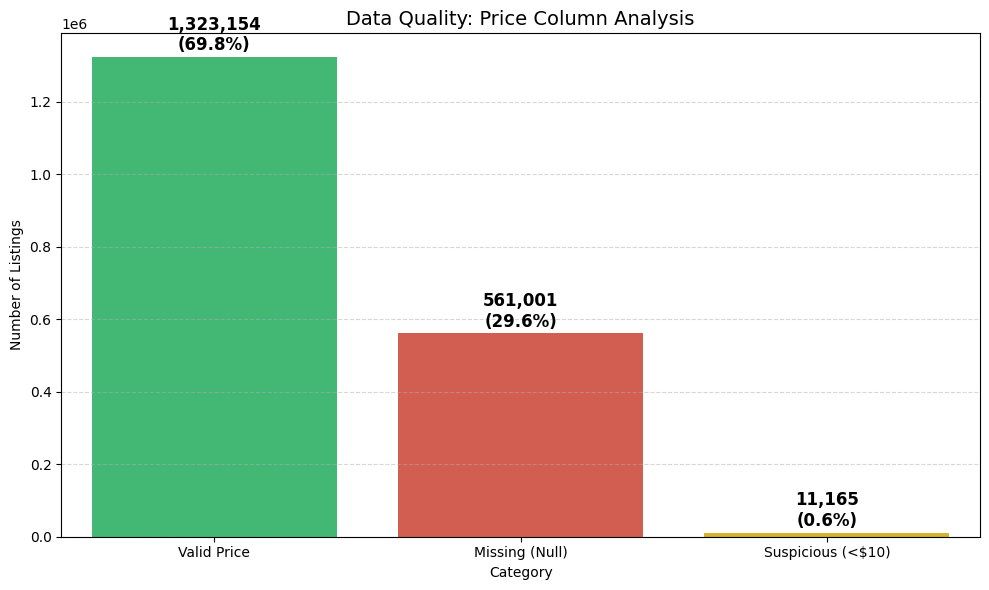

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pyspark.sql.functions import col

print("Visualizing Price Data Quality")

#three buckets: Valid, Null, and Low
total_rows = airbnb_deduped.count()
null_count = airbnb_deduped.filter(col("price").isNull()).count()
low_count = airbnb_deduped.filter((col("price").isNotNull()) & (col("price") < 10)).count()
valid_count = total_rows - (null_count + low_count)

data = {
    'Category': ['Valid Price', 'Missing (Null)', 'Suspicious (<$10)'],
    'Count': [valid_count, null_count, low_count],
    'Color': ['#2ecc71', '#e74c3c', '#f1c40f'] # Green, Red, Yellow
}
df_plot = pd.DataFrame(data)

# Calculate percentages for labels
df_plot['Percentage'] = (df_plot['Count'] / total_rows) * 100

# 3. Create the Graph
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=df_plot, x='Category', y='Count', palette=data['Color'])

plt.title('Data Quality: Price Column Analysis', fontsize=14)
plt.ylabel('Number of Listings')
plt.grid(axis='y', linestyle='--', alpha=0.5)

# 4. Add Labels on top of bars
for i, p in enumerate(ax.patches):
    height = p.get_height()
    pct = df_plot.iloc[i]['Percentage']
    ax.text(p.get_x() + p.get_width()/2., height + (total_rows * 0.01),
            f'{int(height):,}\n({pct:.1f}%)',
            ha="center", fontsize=12, fontweight='bold', color='black')

plt.tight_layout()
plt.show()

We will now inspect alternative columns (such as total_price or details) for records where the main price is invalid. This will help us determine if we can recover the missing data or if these rows are genuinely empty.

In [0]:
from pyspark.sql.functions import col

bad_price_rows = airbnb_deduped.filter(
    (col("price").isNull()))

display(bad_price_rows.limit(10))

name image description category availability discount reviews seller_info breadcrumbs location pets_allowed description_items category_rating house_rules details highlights arrangement_details amenities images available_dates url final_url listing_title property_id listing_name location_details description_by_sections description_html location_details_html is_supperhost host_rating hosts_year host_response_rate is_guest_favorite travel_details pricing_details currency cancellation_policy country postcode_map_url host_image host_details price total_price host_number_of_reviews property_number_of_reviews guests ratings lat long Rental unit in San Marcos · 1 bedroom · 2 beds · 1 bath https://a0.muscache.com/pictures/miso/Hosting-1000634441832511261/original/f1ea230c-5d6c-4f4f-b97f-967497df5fab.jpeg Casa Ana is a very pretty little house with a large terrace, small verandas and nooks and crannies where you can relax and enjoy the stunning sea views.The spaceIt is located at the top of the cliff that leads to Playa de San Marcos, a small enclave on the north coast of Tenerife, belonging to Icod de los Vinos. The views from the house, directly over the sea and the coast, are spectacular. These views can be enjoyed from the magnificent terrace.The house is easily accessible from the motorway, taking the road that leads to the beach and is very well connected when planning excursions to different parts of the island. The house is uniquely decorated, fully equipped with furniture and electrical appliances. There is a portion of the large front terrace of the house, each with its own table and chairs to enjoy the breathtaking sunsets of this part of the coast.The house also has small spaces for relaxation in the small gazebo.Other things to noteParking: Next to the Lourdes building on the main road downhill from San MarcosRegistration number38379AAXAI Stays true null ["This company ruined my holiday. They cancelled my booking due to overbooking the day before we travel. They offer an alternative but it was not like for like, it did not have a view. There was no offer of reduced price. I asked for a refund instead. I had to book alternative accommodation which given that it was last minute was not the same. It did have a view but was in a different location and did not have cooking facilities and cost more to book. I am now out of pocket due to having to eat out as well. I had to chase the refund multiple times which added stress. I do not have the money to have that amount out of my account and led to me being able to do less on holiday. Poor organisation on the owners part should not have impacted me and I shouldn’t have had to deal with it. It is unprofessional and ruined my time away. To get the refund, I took it up with Airbnb who dealt with it, by then I was back from holiday. My request for compensation has been ignored."] {"seller_id":"87974436","url":"https://www.airbnb.com/users/show/87974436"} San Marcos, Canarias, Spain San Marcos, Canarias, Spain false ["Entire rental unit","2 beds","1 bath"] [] ["Check-in: 3:00 p.m.–12:00 a.m.","Checkout before 11:00 a.m.","4 guests maximum"] ["4 guests","1 bedroom","2 beds","1 bath"] [{"name":"20-min drive to Teide National Park","value":"This home is near the national park."},{"name":"Self check-in","value":"Check yourself in with the lockbox."},{"name":"Ocean view","value":"Soak up the view during your stay."}] [{"name":"Bedroom","value":"1 double bed"},{"name":"Living room","value":"1 sofa bed"}] [{"group_name":"Scenic views","items":[{"name":"Ocean view","value":"SYSTEM_VIEW_OCEAN"},{"name":"Sea view","value":"SYSTEM_VIEW_OCEAN"}]},{"group_name":"Bathroom","items":[{"name":"Hair dryer","value":"SYSTEM_HAIRDRYER"},{"name":"Cleaning products","value":"SYSTEM_CLEANING_SUPPLIES"},{"name":"Shampoo","value":"SYSTEM_SHAMPOO"},{"name":"Body soap","value":"SYSTEM_SOAP"},{"name":"Hot water","value":"SYSTEM_HOT_WATER"},{"name":"Shower gel","value":"SYSTEM_SOAP"}]},{"group_name":"Bedroom and laund

In [0]:
from pyspark.sql.functions import col

low_price_rows = airbnb_deduped.filter(
    (col("price")<10))

display(low_price_rows.limit(10))

name image description category availability discount reviews seller_info breadcrumbs location pets_allowed description_items category_rating house_rules details highlights arrangement_details amenities images available_dates url final_url listing_title property_id listing_name location_details description_by_sections description_html location_details_html is_supperhost host_rating hosts_year host_response_rate is_guest_favorite travel_details pricing_details currency cancellation_policy country postcode_map_url host_image host_details price total_price host_number_of_reviews property_number_of_reviews guests ratings lat long Hotel in San Francisco · 1 bedroom · 1 bed · 1 private bath https://a0.muscache.com/pictures/miso/Hosting-1003516198863121163/original/2aa26be1-4069-4c28-8ea2-b0cce148de83.jpeg Experience the heart of the city at our charming downtown boutique hotel. Our rooms and service will make your stay truly memorable. We are conveniently located near a park, beach, restaurants, and public transportation, so you can easily explore all that the city has to offer.Registration numberExempt Stays true null null {"seller_id":"542041520","url":"https://www.airbnb.com/users/show/542041520"} San Francisco, California, United States San Francisco, California, United States false ["Room in hotel","1 bed","1 private bath"] [] ["Check-in: 4:00 PM - 12:00 AM","Checkout before 11:00 AM","2 guests maximum"] ["2 guests","1 bedroom","1 bed","1 private bath"] [{"name":"Dedicated workspace","value":"A room with wifi that’s well-suited for working."},{"name":"Self check-in","value":"Check yourself in with the smartlock."}] null [{"group_name":"Bathroom","items":[{"name":"Hair dryer","value":"SYSTEM_HAIRDRYER"},{"name":"Shampoo","value":"SYSTEM_SHAMPOO"},{"name":"Conditioner","value":"SYSTEM_SHAMPOO"},{"name":"Body soap","value":"SYSTEM_SOAP"},{"name":"Hot water","value":"SYSTEM_HOT_WATER"},{"name":"Shower gel","value":"SYSTEM_SOAP"}]},{"group_name":"Bedroom and laundry","items":[{"name":"Essentials","value":"Towels, bed sheets, soap, and toilet paper"},{"name":"Hangers","value":"SYSTEM_HANGERS"},{"name":"Bed linens","value":"SYSTEM_BLANKETS"},{"name":"Extra pillows and blankets","value":"SYSTEM_PILLOW"},{"name":"Room-darkening shades","value":"SYSTEM_BLACKOUT_SHADES"},{"name":"Clothing storage","value":"SYSTEM_WARDROBE"}]},{"group_name":"Entertainment","items":[{"name":"TV","value":"SYSTEM_TV"}]},{"group_name":"Family","items":[{"name":"Outlet covers","value":"SYSTEM_OUTLET_COVER"}]},{"group_name":"Home safety","items":[{"name":"Exterior security cameras on property","value":"Entrance and public areas only"},{"name":"Smoke alarm","value":"SYSTEM_DETECTOR_SMOKE"},{"name":"Carbon monoxide alarm","value":"SYSTEM_DETECTOR_CO"},{"name":"Fire extinguisher","value":"SYSTEM_FIRE_EXTINGUISHER"},{"name":"First aid kit","value":"SYSTEM_FIRST_AID_KIT"}]},{"group_name":"Internet and office","items":[{"name":"Wifi","value":"SYSTEM_WI_FI"},{"name":"Dedicated workspace","value":"In a room with a door"}]},{"group_name":"Kitchen and dining","items":[{"name":"Refrigerator","value":"SYSTEM_REFRIGERATOR"},{"name":"Microwave","value":"SYSTEM_MICROWAVE"},{"name":"Mini fridge","value":"SYSTEM_MINI_BAR"},{"name":"Kitchenette","value":"Space where guests can heat up and refrigerate food"}]},{"group_name":"Location features","items":[{"name":"Private entrance","value":"Separate street or building entrance"},{"name":"Laundromat nearby","value":"SYSTEM_LAUNDRY_SERVICE"}]},{"group_name":"Parking and facilities","items":[{"name":"Elevator","value":"The home or building has an elevator that’s at least 52 inches deep and a doorway at least 32 inches wide"},{"name":"Paid parking off premises","value":"SYSTEM_MAPS_CAR_RENTAL"}]},{"group_name":"Services","items":[{"name":"Luggage dropoff allowed","value":"For guests' convenience when they have early arrival or late departure"},{"name":"Long term stays allowed","value":"Allow stay for 28 days or more"},{"name":"Self check

Upon inspecting records with missing or invalid prices, we confirmed that auxiliary columns like total_price and details are also empty or do not give enough information for us to understand price per night. However, we have decided not to drop these rows. Since our application's primary goal is to find the best properties based on the user's overall trip objectives (location, amenities, vibe), removing these listings would eliminate potentially perfect matches. Instead, we will retain the data and flag these specific properties in the final interface, advising the user to "Contact Host" for accurate pricing details.

##### Adding Fraud Flag Column

To prioritize user safety and decision-making confidence, we implemented a Fraud Detection system. This feature analyzes listings for critical risk factors, such as missing prices, zero reviews or rating of 0, or suspicious keywords on reviews like "this is a fraud" and flags the properties into suspicious or not (we create a new column for this flag per property). This will help us in the future with our creation of our app/website to guide users to "Contact Host" for clarification and be cautious with unverified properties, ensuring a secure and high-quality experience.

In [0]:
from pyspark.sql.functions import col, when, lower, lit, concat_ws

print("--- Building Fraud Detection Layer ---")

# 1. Define Suspicious Conditions

# A. No reviews or no ratings 
cond_no_social_proof = (col("property_number_of_reviews") == 0) | \
                       (col("property_number_of_reviews").isNull()) | \
                       (col("ratings") == 0) | \
                       (col("ratings").isNull()) | \
                       (col("reviews").isNull())

# B.Look for suspicious words in reviews.
suspicious_words = ["fraud", "scam", "fake", "money laundering", "don't book", "do not book"]
cond_keyword_flag = lit(False) 

for word in suspicious_words:
    cond_keyword_flag = cond_keyword_flag | lower(col("reviews")).contains(word)

# C. Price is Null or too low 
cond_bad_price = (col("price").isNull()) | (col("price") < 10)


# 2. Apply Flags (True/False columns for your analysis)
# -------------------------------
airbnb_tagged = airbnb_deduped.withColumn("flag_no_reviews", cond_no_social_proof) \
                            .withColumn("flag_suspicious_text", cond_keyword_flag) \
                            .withColumn("flag_bad_price", cond_bad_price)


# 3. Create the "Safety Alert"
airbnb_safety = airbnb_tagged.withColumn(
    "safety_alert",
    when(col("flag_bad_price") == True, "Price Alert: Price missing or unusually low.")
    .when(
        (col("flag_suspicious_text") == True) & ((col("ratings") < 3.5) | col("ratings").isNull()), 
        "CRITICAL: Potential Scam reported & Low Ratings."
    )
    .when(
        (col("flag_suspicious_text") == True) & (col("ratings") >= 3.5), 
        "Warning: Generally good, but some suspicious reviews detected."
    )
    .when(col("flag_no_reviews") == True, "No reviews yet.")

    .otherwise("Verified: Listing appears normal.")
)

print("Safety Analysis Complete.")
print("Distribution of Alerts:")
airbnb_safety.groupBy("safety_alert").count().orderBy("count").show(truncate=False)

# Show examples of flagged listings
print("\n--- Sample of Suspicious Listings ---")
cols_to_show = ["property_id", "price", "property_number_of_reviews", "safety_alert"]
display(airbnb_safety.filter(col("safety_alert") != "Verified: Listing appears normal.").select(cols_to_show).limit(10))

--- Building Fraud Detection Layer ---
Safety Analysis Complete.
Distribution of Alerts:
+--------------------------------------------------------------+------+
|safety_alert                                                  |count |
+--------------------------------------------------------------+------+
|CRITICAL: Potential Scam reported & Low Ratings.              |894   |
|Warning: Generally good, but some suspicious reviews detected.|7026  |
|No reviews yet.                                               |333438|
|Price Alert: Price missing or unusually low.                  |572117|
|Verified: Listing appears normal.                             |981845|
+--------------------------------------------------------------+------+


--- Sample of Suspicious Listings ---


property_id,price,property_number_of_reviews,safety_alert
1000634441832511261,null,null,Price Alert: Price missing or unusually low.
1000680287660440327,null,null,Price Alert: Price missing or unusually low.
1000811217854592600,null,48.0,Price Alert: Price missing or unusually low.
1000908118739582806,95.0,null,No reviews yet.
1000944664189456847,107.0,0.0,No reviews yet.
1001160053132225202,null,1.0,Price Alert: Price missing or unusually low.
1001328793430997592,1096.0,null,No reviews yet.
1001354528846840044,135.0,null,No reviews yet.
1001396027838904939,null,136.0,Price Alert: Price missing or unusually low.
1001417619012615046,241.0,null,No reviews yet.


To build this safety layer, we implemented a multi-stage filtering process using PySpark. First, we define three distinct risk categories: Social Proof Gaps (listings with zero ratings or null reviews), Keyword Analysis (scanning review text for red flags like 'fraud', 'scam', or 'do not book'), and Pricing Anomalies (listings with missing or unrealistically low prices). Crucially, the keyword detection uses an iterative loop with logical OR operators to ensure multiple suspicious terms are accumulated rather than overwritten. Finally, we synthesize these flags into a single, user-friendly safety_alert column. This uses a prioritized hierarchy: flagged listings with high ratings (>4.0) receive a mild warning for mixed reviews, while flagged listings with low ratings trigger critical alerts, allowing our application to distinguish between a bad customer experience and a potential scam.

--- Visualizing Fraud Patterns ---


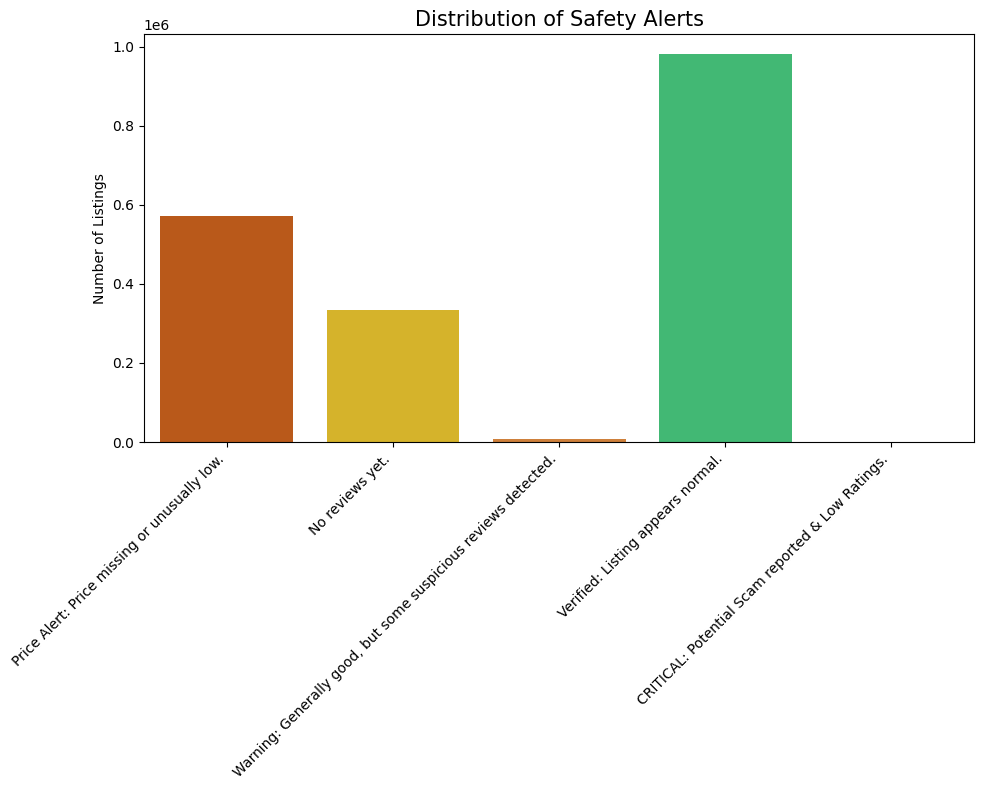

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from pyspark.sql.functions import col

print("--- Visualizing Fraud Patterns ---")

# 1. PREPARE DATA 
# We group by the new alert column to get the counts
alert_counts = airbnb_safety.groupBy("safety_alert").count().toPandas()

plt.figure(figsize=(10, 8))

# 2. DEFINE PALETTE (Updated to match your new "Smart" logic)
palette = {
    "Verified: Listing appears normal.": "#2ecc71", 

    "No reviews yet.": "#f1c40f", 
    
    "Warning: Generally good, but some suspicious reviews detected.": "#e67e22", 
    
    "Price Alert: Price missing or unusually low.": "#d35400", 
    
    "CRITICAL: Potential Scam reported & Low Ratings.": "#e74c3c"
}

# 3. PLOT
sns.barplot(data=alert_counts, x="safety_alert", y="count", palette=palette)

plt.title("Distribution of Safety Alerts", fontsize=15)
plt.ylabel("Number of Listings")
plt.xlabel("")

# Rotate labels so they don't overlap (since they are long sentences now)
plt.xticks(rotation=45, ha='right', fontsize=10)

plt.tight_layout()
plt.show()

In [0]:

airbnb_final = airbnb_safety
display(airbnb_final.limit(10))

name image description category availability discount reviews seller_info breadcrumbs location pets_allowed description_items category_rating house_rules details highlights arrangement_details amenities images available_dates url final_url listing_title property_id listing_name location_details description_by_sections description_html location_details_html is_supperhost host_rating hosts_year host_response_rate is_guest_favorite travel_details pricing_details currency cancellation_policy country postcode_map_url host_image host_details price total_price host_number_of_reviews property_number_of_reviews guests ratings lat long flag_no_reviews flag_suspicious_text flag_bad_price safety_alert Cabin in Toston · ★4.93 · 2 bedrooms · 2 beds · 0 baths https://a0.muscache.com/pictures/miso/Hosting-1000004478168460065/original/12a3f284-6c27-4dc0-acf7-d5ccdbcf87d9.jpeg A little piece of paradise nestled in the hills for relaxing with the family. Just far enough off the beaten path, for that peace and quiet, but still close enough to major surrounding towns. Is a short drive to trail heads for crow creek falls or lake, many trails and roads for exploring.Other things to noteBring own bedding, towels are provided for the seasonal outdoor shower. Outhouse is short walk from the cabin. Cabin heated by Woodstove, with firewood provided. Lights run on solar power, with back up generator for electric appliances guests may bring in. All kitchen utensils and dishes provided. Has 2 burner propane camp chef and barbequer, or if adventurous a cook station outside.Two beds and additional futon for possible 6 people. Water provided via well at cabin. Stays true null ["It was just what you would expect a tiny cabin to be. I took some photos of my own, her listing didn't really include a lot of photos-complete with bear skin! It was really quiet, would be a great place for a family to camp if they didn't want to sleep in a tent. After night fall, when the cloud cover cleared, I noticed this would be a great place to set up a telescope, or for those who chase aurora, because there's no light pollution. I made a tin foil meal, over the fire, and had just the right amount of wind. I arrived after a hike, the temperature was 80° and my car was hot. The cabin was surprisingly cool due to concrete floor!","Great place, very cozy if you are familiar with \"off the grid\". Beautiful surroundings & very peaceful. Me and my family enjoyed our, great stay.","Loved the peace and quiet. Loved the beautiful clean cabin. I enjoyed the wood stove. One thing not to do is use the google map instructions. I will be renting her cabin again. Thank you Jackie.","Little cabin on the prairie was one of the best airbnb’s we’ve ever stayed in!! We loved it so much and can’t wait to stay there again!!","always look forward to book the gem. this morning we watched a HUGE herd of elk and DEER SO so close it was beautiful. many acres of gorgeous views and always love it here.","This was our second stay at Little Cabin On The Prairie and definitely not our last! If you are looking to get off the grid and have bluebirds and mule deer for neighbors this is for you!","We had a great stay! The cabin was so cozy & the location was beautiful.","Beautiful cabin on the prairie with renewable energy lights and spacious back yard","Wonderful as always! My favorite airbnb i've ever stayed at.","Jackie was great! This Cabin is a nice peaceful retreat from the city. we enjoyed it very much","was very beautiful place. the cabin was very clean, and restful. the view was great. Jackie was very responsive to anything we had questions about. would loved to stay longer.","This place was awesome. Would highly recommend staying here.","the cabin was awesome and we loved it","We had a great time at the cabin on Mud Springs. Looking forward to next time!","Great place. Super easy to work with and easy to find. Will definitely be staying again.","perfect for our needs and worked great. Jackie is a great ho

## Cleaning and preprocessing of Booking data

In [0]:
from pyspark.sql.functions import col, lit, count, when, expr, rand

print("--- Step 0: Initial Raw Count ---")
raw_count = booking.count()
print(f"Total Raw Rows: {raw_count}")

--- Step 0: Initial Raw Count ---
Total Raw Rows: 3239391


In [0]:
from pyspark.sql.functions import col

print("--- Step 0: Inspect Raw Schema ---")
booking.printSchema()

--- Step 0: Inspect Raw Schema ---
root
 |-- availability: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- bed_configuration: string (nullable = true)
 |    |    |-- max_number_of guests: string (nullable = true)
 |    |    |-- max_number_of_guests: long (nullable = true)
 |    |    |-- room_type: string (nullable = true)
 |-- city: string (nullable = true)
 |-- coordinates: struct (nullable = true)
 |    |-- lan: double (nullable = true)
 |    |-- lon: double (nullable = true)
 |-- country: string (nullable = true)
 |-- description: string (nullable = true)
 |-- fine_print: string (nullable = true)
 |-- hotel_id: string (nullable = true)
 |-- house_rules: array (nullable = true)
 |    |-- element: struct (containsNull = true)
 |    |    |-- description: string (nullable = true)
 |    |    |-- rule: string (nullable = true)
 |-- images: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- location: string (nullable = true)


All types make sense so we will not do any casting.

##### Checking for NULL hotel_id and duplicates:

In [0]:
from pyspark.sql.functions import col

booking_copy = booking 
# 1. Check for NULL IDs
null_id_count = booking_copy.filter(col("hotel_id").isNull()).count()
print(f"Rows with missing (NULL) hotel_id: {null_id_count}")

# 2. Check for Duplicates 
duplicate_ids_df = booking_copy.groupBy("hotel_id").count().filter(col("count") > 1)
duplicate_id_count = duplicate_ids_df.count()

print(f"Number of hotel_ids that are duplicated: {duplicate_id_count}")

if duplicate_id_count > 0:
    print("Sample of duplicated IDs:")
    duplicate_ids_df.orderBy(col("count").desc()).show(5)

Rows with missing (NULL) hotel_id: 0
Number of hotel_ids that are duplicated: 0


##### Checking for missing coordinates

In [0]:
from pyspark.sql.functions import col


# 1. Count rows with missing Lat OR Long
missing_loc_df = booking_copy.filter(
    col("coordinates.lan").isNull() | col("coordinates.lon").isNull()
)
missing_count = missing_loc_df.count()
total_rows = booking.count()

print(f"Total Rows: {total_rows}")
print(f"Rows with Missing Coordinates: {missing_count} ({missing_count/total_rows:.2%})")

if missing_count > 0:
    print("\n--- Sample of Rows Missing Coordinates ---")
    missing_loc_df.select("hotel_id", "city", "location", "coordinates").show(5, truncate=False)

Total Rows: 3239391
Rows with Missing Coordinates: 3092 (0.10%)

--- Sample of Rows Missing Coordinates ---
+--------+----+-----------------------------------------------------------------+-----------+
|hotel_id|city|location                                                         |coordinates|
+--------+----+-----------------------------------------------------------------+-----------+
|12569794|NULL|Estrada Highlander, Chã Grande, CEP 55636-000, Brazil            |NULL       |
|12978696|NULL|Kenwood Street 1099, Green Bay, 54304, United States             |NULL       |
|12590429|NULL|64 Templeman Road, 6571 Knysna, South Africa                     |NULL       |
|9792583 |NULL|Urbanizacion Camarate Golf, 5, 29690 Estepona, Spain             |NULL       |
|11850143|NULL|500 Avenida Dionysia Alves Barreto, Osasco, CEP 06086-040, Brazil|NULL       |
+--------+----+-----------------------------------------------------------------+-----------+
only showing top 5 rows



The % of records with missing coordinates is very small so we decided to delete them from our dataset instead of trying to get the coordinates using the location column.


In [0]:
# delete rows of booking_copy that have null coordinates 
booking_copy = booking_copy.dropna(subset=["coordinates.lan", "coordinates.lon"])

##### Standardizing ratings

To ensure a fair analysis and model across our unified dataset (airbnb + booking), we implemented a "Smart Normalization" strategy for Booking.com ratings. We identified that a simple mathematical scaling (dividing by 2) failed to capture user sentiment, as a "good" score on Booking (e.g., 8.0) would translate to a mediocre score on Airbnb (4.0). To address this, we adopted an **Range Mapping** approach: ratings of 7.0 and above are linearly mapped to the competitive Airbnb rating (4.0 - 5.0), while lower scores retain a standard scaling. This ensures that high-quality hotels from Booking.com are accurately represented alongside top-tier Airbnb listings.

In [0]:
from pyspark.sql.functions import col, when, round

booking_clean = booking_copy.withColumn(
    "rating_norm",
    when(col("review_score") >= 7.0, 
         # Map [7-10] to [4-5]
         # Formula: Base 4 + (Difference from 7 * 0.333)
         round(4.0 + ((col("review_score") - 7.0) / 3.0), 2)
    )
    .otherwise(
         # Simple division works fine here
         round(col("review_score") / 2.0, 2)
    )
)

# Comparison to see the difference
print("Impact of Smart Standardization:")
booking_clean.select("review_score", "rating_norm").filter(col("review_score").isin([6.0, 7.0, 8.0, 9.0, 10.0])).distinct().orderBy("review_score").show()

Impact of Smart Standardization:
+------------+-----------+
|review_score|rating_norm|
+------------+-----------+
|         6.0|        3.0|
|         7.0|        4.0|
|         8.0|       4.33|
|         9.0|       4.67|
|        10.0|        5.0|
+------------+-----------+



##### Looking for suspicious listings:

In [0]:
from pyspark.sql.functions import col, when, lower, lit, concat_ws

print("--- Building Booking.com Fraud Detection Layer ---")

# 1. PREPARE TEXT ANALYSIS
# Flatten the array of reviews into one string
reviews_text_col = lower(concat_ws(" ", col("top_reviews.review")))

# 2. DEFINE CONDITIONS

# A. No Social Proof
# We check if rating_norm is null/0 OR reviews count is 0
cond_no_social_proof = (col("number_of_reviews") == 0) | \
                       (col("number_of_reviews").isNull()) 

# B. Keyword Risk
suspicious_words = ["fraud", "scam", "fake", "money laundering", "don't book", "do not book"]
cond_keyword_flag = lit(False)

for word in suspicious_words:
    cond_keyword_flag = cond_keyword_flag | reviews_text_col.contains(word)


# 3. APPLY INTERMEDIATE FLAGS
booking_tagged = booking_clean.withColumn("flag_no_reviews", cond_no_social_proof) \
                              .withColumn("flag_suspicious_text", cond_keyword_flag) 


# 4. CREATE THE "SMART" SAFETY ALERT
booking_safety = booking_tagged.withColumn(
    "safety_alert",
    
    # Priority 2: CRITICAL SCAM 
    # Logic: Suspicious Words + Rating < 3.5 (Using your NORMALISED score)
    when(
        (col("flag_suspicious_text") == True) & ((col("rating_norm") < 3.5) | col("rating_norm").isNull()), 
        "CRITICAL: Potential Scam reported & Low Ratings."
    )
    
    # Priority 3: WARNING 
    # Logic: Suspicious Words + Rating >= 3.5 (Good rating, but angry review)
    .when(
        (col("flag_suspicious_text") == True) & (col("rating_norm") >= 3.5), 
        "Warning: Generally good, but some suspicious reviews detected."
    )
    
    # Priority 4: New Listings
    .when(col("flag_no_reviews") == True, "New Listing: No reviews yet.")
    
    # Priority 5: Safe
    .otherwise("Verified: Listing appears normal.")
)

# 5. VERIFY RESULTS
print("Safety Analysis Complete.")
print("Distribution of Alerts:")
booking_safety.groupBy("safety_alert").count().orderBy("count", ascending=False).show(truncate=False)

# Show examples (Focusing on the Normalized Rating to prove it worked)
print("\n--- Sample of Suspicious Listings ---")
display(booking_safety.limit(10))

--- Building Booking.com Fraud Detection Layer ---
Safety Analysis Complete.
Distribution of Alerts:
+--------------------------------------------------------------+-------+
|safety_alert                                                  |count  |
+--------------------------------------------------------------+-------+
|New Listing: No reviews yet.                                  |1833086|
|Verified: Listing appears normal.                             |1397414|
|Warning: Generally good, but some suspicious reviews detected.|3606   |
|CRITICAL: Potential Scam reported & Low Ratings.              |2193   |
+--------------------------------------------------------------+-------+


--- Sample of Suspicious Listings ---


availability city coordinates country description fine_print hotel_id house_rules images location managed_by manager_language_spoken manager_score metro_railway_access most_popular_facilities number_of_reviews popular_facilities property_highlights property_information property_surroundings review_score reviews_scores title top_reviews url rating_norm flag_no_reviews flag_suspicious_text safety_alert List(List(1 king bed, null, 2, One-Bedroom Apartment)) Vrindāvan List(27.5737379354334, 77.6546632927292) India Featuring a garden, Mero vrindavan Luxury aavas features accommodations in Vrindāvan. This property offers access to a terrace, free private parking, and free Wifi.

This apartment will provide guests with 1 bedroom, a flat-screen TV, and air conditioning. The apartment also includes 1 bathroom.

Bharatpur Train Station is 31 miles from the apartment, while Mathura Train Station is 9 miles from the property. Agra Airport is 41 miles away. This property does not accommodate bachelor(ette) or similar parties. 12919785 List(List(From 12:00 PM to 11:00 PM You need to let the property know what time you'll be arriving in advance., Check-in), List(From 8:00 AM to 11:00 AM, Check-out), List(Cancellation and prepayment policies vary according to accommodation type. Enter your stay dates and check the conditions of your selected option., Cancellation/ prepayment), List(Child policies Children of all ages are welcome. To see correct prices and occupancy info, add the number and ages of children in your group to your search. Crib and extra bed policies Cribs and extra beds aren't available at this property., Children & Beds), List(There's no age requirement for check-in, No age restriction), List(Smoking is not allowed., Smoking), List(Parties/events are not allowed, Parties), List(Free! Pets are allowed. No extra charges., Pets)) List(https://cf.bstatic.com/xdata/images/hotel/max200/603653035.jpg?k=389f38be85031d2743f99b2fa6dfb9057557c739a921c74399ef5a0ef2d13edd&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653144.jpg?k=f363b0b79f3a6cd34c0deea79fe914db2e9ff4de19718324c9984c473167f21c&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653114.jpg?k=d1db0a18879b81d88ced90184f7baf3d69a655690cb52845fcc66c4734ab1135&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653103.jpg?k=b4196fc9b98950240db78d9648f8c8f88cedad19a0421c8c2c09a056bda0b214&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653086.jpg?k=c947befcb2f56d906e33488fe3bf63dc93a7902d037e2a8e36b8f87dc782261b&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653112.jpg?k=5e4ac49a4cd1ebfceb59314e1c81e80b115250e34a7f8f2784998ea924831857&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653083.jpg?k=ea5c5f07e22411dbe5a8efe3b38d2186907f87c4d6a7b59e4225902920d7e57b&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653080.jpg?k=1a8ad31134e2089042228673eb427c58b040904707917123325d70b8e70bbeb4&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653068.jpg?k=e398c11b34fa5dc518938f033b9234c55b024a0857fa0ff7954399ed1968975f&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653075.jpg?k=d64617957b2a3a2aa8038da09e33c7502bad000c06fea6f2580d4d4ec61931d6&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653077.jpg?k=6e8a8110d71315753c82807a0983eff2cd53c2073abd818f8cec72e646fb2d87&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653088.jpg?k=b2410bbebbf7e7747d63e1eb371676d2b7c142886e49d764bb2eca8ff22ad1b4&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653093.jpg?k=01e8307caea449129657723dd6674cc021f583ec1df15e1bd56aac26ddbee099&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653098.jpg?k=2941324ca574eccb9e3d0eea87e5d46d8151d66b6753ff4fcefd4cdb53203ff7&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653107.jpg?k=2030818f224ee99b97e139e3f0bc79778dd21f32204ae3618fdb13ae7dbac145&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653119.jpg?k=c46bd7884d30ab675cb06330515457f6d56f47bae3ffbc616e449913cae680

In [0]:
categories_to_check = [
    "CRITICAL: Potential Scam reported & Low Ratings.", # Note: I updated this to match your actual label
    "New Listing: No reviews yet.",
    "Warning: Generally good, but some suspicious reviews detected.",
    "Verified: Listing appears normal."
]

for category in categories_to_check:
    print(f"--- SAMPLES FOR: {category} ---")
    
    sample_df = booking_safety.filter(col("safety_alert") == category)
    display(sample_df.limit(3))

--- SAMPLES FOR: CRITICAL: Potential Scam reported & Low Ratings. ---


availability city coordinates country description fine_print hotel_id house_rules images location managed_by manager_language_spoken manager_score metro_railway_access most_popular_facilities number_of_reviews popular_facilities property_highlights property_information property_surroundings review_score reviews_scores title top_reviews url rating_norm flag_no_reviews flag_suspicious_text safety_alert List(List(1 full bed, 1 bunk bed | 1 sofa bed, null, 5, One-Bedroom Apartment)) Santa Marta List(11.2056679007141, -74.2275765720445) Colombia Apartamento frente al mar - Rodadero offers accommodations in Santa Marta, a few steps from El Rodadero Beach and 1.4 miles from Rodadero Sea Aquarium and Museum. This beachfront property offers access to free Wifi. Santa Marta Gold Museum is 3.8 miles from the apartment and Simon Bolivar Park is 4 miles away.

The air-conditioned apartment is composed of 1 separate bedroom, a living room, a fully equipped kitchen, and 1 bathroom. A flat-screen TV is featured. The accommodation is non-smoking.

Santa Marta Cathedral is 3.5 miles from the apartment, while Santa Marta Marina is 3.6 miles away. Simón Bolívar International Airport is 6.2 miles from the property. This property does not accommodate bachelor(ette) or similar parties. License number: 184859 12836975 List(List(From 3:00 PM to 6:00 PM You need to let the property know what time you'll be arriving in advance., Check-in), List(From 8:00 AM to 11:00 AM, Check-out), List(Cancellation and prepayment policies vary according to accommodation type. Enter your stay dates and check the conditions of your selected option., Cancellation/ prepayment), List(Child policies Children of all ages are welcome. To see correct prices and occupancy info, add the number and ages of children in your group to your search. Crib and extra bed policies Cribs and extra beds aren't available at this property., Children & Beds), List(There's no age requirement for check-in, No age restriction), List(Smoking is not allowed., Smoking), List(Parties/events are not allowed, Parties), List(Pets are not allowed., Pets)) List(https://cf.bstatic.com/xdata/images/hotel/max200/598838168.jpg?k=1612781ab95b7f772809eefcd8cf7a216e1c88fd47497f6651b8106a5a6d502c&o=, https://cf.bstatic.com/xdata/images/hotel/max200/598838178.jpg?k=3a0e7ff305868a69a16523da78dd5c241babbe8ea3beb1c6173bc36d104d8871&o=, https://cf.bstatic.com/xdata/images/hotel/max200/598838187.jpg?k=f79db37e85f1496aae5e69ca2a5cb064549e06499cc76c488f0adf6249f72526&o=, https://cf.bstatic.com/xdata/images/hotel/max200/598838186.jpg?k=a0a9730267efcda8c6dcde102deeca167c98a2b930af91d998aeff4a03f24dce&o=, https://cf.bstatic.com/xdata/images/hotel/max200/598838955.jpg?k=8f3cf6c1e28475672485b4349b4ac5266b92cec43019f40a6e77e1a80ae95201&o=, https://cf.bstatic.com/xdata/images/hotel/max200/598838181.jpg?k=66086c339a5aa178e38deef75491e86c385a1d4f47281552648a995f3d1e12f8&o=, https://cf.bstatic.com/xdata/images/hotel/max200/598838180.jpg?k=8fead8e0936396b39f133b01ab30e17d38919f4dc0478a9709cdfe69e0ba1001&o=, https://cf.bstatic.com/xdata/images/hotel/max200/598838185.jpg?k=79c278bb44ed3fa3717b392ee872a04819577ef28b6da797c77edd597295b2d5&o=, https://cf.bstatic.com/xdata/images/hotel/max200/684707207.jpg?k=a11bb2596d6c6762abd772d9fd1214812591bb7c50a9ee4fd4747e2e9577a2b2&o=, https://cf.bstatic.com/xdata/images/hotel/max200/598838183.jpg?k=b9e73c13bda6fe7831c50cd550c780275f1e86437c76c3b2656213ff097f9606&o=, https://cf.bstatic.com/xdata/images/hotel/max200/598838972.jpg?k=25ce0471b99cb1a6fff9dbd98d4a1d857a9279f75e54b9b394d62a2da7d7a77b&o=) Carrera 1 #6-55, 470006 Santa Marta, Colombia null List(English, Spanish) null false List(Parking on site, Beachfront, Free Wifi, Family rooms, Non-smoking rooms, Air conditioning, Parking on site, Beachfront, Free Wifi, Family rooms, Non-smoking rooms, Air conditioning) 8 List(null, null) Parking on site. Beachfront. Free Wifi. Family rooms. Non-smoking rooms. Air conditioning. Parking on site. Beachfro

--- SAMPLES FOR: New Listing: No reviews yet. ---


availability city coordinates country description fine_print hotel_id house_rules images location managed_by manager_language_spoken manager_score metro_railway_access most_popular_facilities number_of_reviews popular_facilities property_highlights property_information property_surroundings review_score reviews_scores title top_reviews url rating_norm flag_no_reviews flag_suspicious_text safety_alert List(List(1 king bed | 1 queen bed | 1 queen bed | 2 twin beds, 2 full beds, null, 12, Four-Bedroom House)) Liberty List(33.343518, -112.440015) US Estrella Mountain Masterpiece is located in Liberty, just 28 miles from Copper Square and 28 miles from Phoenix Convention Center. Offering a restaurant, the property also has pool with a view, as well as a hot tub and a spa facilities. The vacation home also offers facilities for disabled guests.

Providing access to a patio with mountain views, the spacious vacation home consists of 4 bedrooms. The air-conditioned vacation home also offers a TV, a fully equipped kitchen with a dishwasher, a seating area, washing machine, and 4 bathrooms with a walk-in shower, a hot tub, and a bath. The property has an outdoor dining area.

For guests with children, the vacation home features a baby safety gate and a children's playground. If you'd like to discover the area, cycling is possible in the surrounding area.

State Farm Stadium is 21 miles from Estrella Mountain Masterpiece, while Arizona Capitol is 27 miles from the property. Phoenix Sky Harbor International Airport is 32 miles away. Guests will receive a rental agreement, which must be signed and returned directly to the property prior to arrival. If the agreement is not received, the guest should contact the property management company at the number on the booking confirmation. Please note that only registered guests are allowed at the property. Guests shall abide by the property's policy. Quiet hours are from 22:00 to 8:00. Guests are required to show a photo ID and credit card upon check-in. Please note that all Special Requests are subject to availability and additional charges may apply. Please inform Estrella Mountain Masterpiece of your expected arrival time in advance. You can use the Special Requests box when booking, or contact the property directly using the contact details in your confirmation. This property does not accommodate bachelor(ette) or similar parties. 12955753 List(List(From 4:00 PM Guests are required to show a photo ID and credit card at check-in. You need to let the property know what time you'll be arriving in advance., Check-in), List(Until 10:00 AM, Check-out), List(Cancellation and prepayment policies vary according to accommodation type. Enter your stay dates and check the conditions of your selected option., Cancellation/ prepayment), List(Child policies Children of all ages are welcome. To see correct prices and occupancy info, add the number and ages of children in your group to your search. Crib and extra bed policies Cribs and extra beds aren't available at this property., Children & Beds), List(The minimum age for check-in is 21, Age restriction), List(Booking.com takes your payment on behalf of the property for this reservation., Payments by Booking.com), List(Smoking is not allowed., Smoking), List(Parties/events are not allowed, Parties), List(Pets are not allowed., Pets)) List(https://cf.bstatic.com/xdata/images/hotel/max200/606622517.jpg?k=8a648d80c596c6046665bd03fd6d529871d30d239eeed9358cc44b8c3d8097f7&o=, https://cf.bstatic.com/xdata/images/hotel/max200/654263047.jpg?k=467592986e2ecb8f85595b5c82f682b6206230e33f843947e2260b1559ce8e3b&o=, https://cf.bstatic.com/xdata/images/hotel/max200/606620587.jpg?k=57ba9c888f406116bf9163e6cab4ed69b78e6f547a415522d92018a39bc3b8d9&o=, https://cf.bstatic.com/xdata/images/hotel/max200/606620678.jpg?k=a45439268f3e31f985e9ef92b144db8d79366e38caeacf41ebedb521ccc6e8be&o=, https://cf.bstatic.com/xdata/images/hotel/max200/654263015.jpg?k=e86437c2539f0ebe0969b896af3d1b7

--- SAMPLES FOR: Warning: Generally good, but some suspicious reviews detected. ---


availability city coordinates country description fine_print hotel_id house_rules images location managed_by manager_language_spoken manager_score metro_railway_access most_popular_facilities number_of_reviews popular_facilities property_highlights property_information property_surroundings review_score reviews_scores title top_reviews url rating_norm flag_no_reviews flag_suspicious_text safety_alert List(List(2 twin beds | 1 sofa bed, null, 4, One-Bedroom Apartment with Living Room)) Krosno List(49.695686, 21.758366) Poland Featuring a bar, Apartament Śródmieście Krosno offers accommodations in Krosno. Both free Wifi and parking on-site are available at the apartment free of charge. Museum of Oil and Gas Industry Foundation is 8.2 miles from the apartment and Magura National Park is 26 miles away.

Offering a terrace and city views, the apartment includes 1 bedroom, a living room, flat-screen TV, an equipped kitchen, and 1 bathroom with a bath and a shower. Towels and bed linen are featured in the apartment. The accommodation is non-smoking.

Guests may eat at the on-site family-friendly restaurant, which is open for lunch and brunch.

Skansen Sanok is 27 miles from Apartament Śródmieście Krosno, while BWA Art Gallery is a 7-minute walk away. Rzeszów-Jasionka Airport is 45 miles from the property. Please inform Apartament Śródmieście Krosno of your expected arrival time in advance. You can use the Special Requests box when booking, or contact the property directly using the contact details in your confirmation. This property does not accommodate bachelor(ette) or similar parties. Quiet hours are between 22:00:00 and 06:00:00. When staying at the property with children, note that the property is legally obliged to apply standards for the protection of minors to determine the identity of the minors and their relationship with the adult they’re staying with. 9816795 List(List(From 2:00 PM to 11:00 PM You need to let the property know what time you'll be arriving in advance., Check-in), List(From 10:00 AM to 11:00 AM, Check-out), List(Cancellation and prepayment policies vary according to accommodation type. Enter your stay dates and check the conditions of your selected option., Cancellation/ prepayment), List(Child policies Children of all ages are welcome. To see correct prices and occupancy info, add the number and ages of children in your group to your search. Crib and extra bed policies Cribs and extra beds aren't available at this property., Children & Beds), List(There's no age requirement for check-in, No age restriction), List(Smoking is not allowed., Smoking), List(Parties/events are not allowed, Parties), List(Guests need be quiet between 10:00 PM and 6:00 AM., Quiet hours), List(Pets are not allowed., Pets)) List(https://cf.bstatic.com/xdata/images/hotel/max200/442659653.jpg?k=80bc14f0a4a401c882f947611d4e56c992eac08b1b00b7b63e5cda4a7573de9d&o=, https://cf.bstatic.com/xdata/images/hotel/max200/546364721.jpg?k=5ee9e0129a6c7dd20d7f95ef1b3b1dda3f236665eecc4ab32ee79e46e3eacd11&o=, https://cf.bstatic.com/xdata/images/hotel/max200/546364718.jpg?k=ef2bad897f5e42844bb7de945a3803a2c3b0d5efad957f49663b867b57ba29b3&o=, https://cf.bstatic.com/xdata/images/hotel/max200/442659758.jpg?k=6880fe6f81311347708d33944668479ae96455ca970d6369dc5a2e8e3031de3e&o=, https://cf.bstatic.com/xdata/images/hotel/max200/546364716.jpg?k=0e2185a15d1ab856a2fe02e7b60b5489412aabc5bc0417ce3ce18fe3a3d63ee2&o=, https://cf.bstatic.com/xdata/images/hotel/max200/442659780.jpg?k=56f4a2a14643b3d88bce31f3741d85551ef045ffeebd8e6fcfc885db3afaa773&o=, https://cf.bstatic.com/xdata/images/hotel/max200/442665531.jpg?k=1e5786ea8ecdc468c0cf9423240f8597a0c8015f9f56bcae8990a50472706051&o=, https://cf.bstatic.com/xdata/images/hotel/max200/442997925.jpg?k=db8a7d7f6c3cd3e7fc47739dc3d1eee52382036938e5dee808f4aef494e86dfe&o=, https://cf.bstatic.com/xdata/images/hotel/max200/442997903.jpg?k=46cf37c5e43375a08e8a7f8dc8f8fac02ac383a8f36f0db50f8c052d21804f15&o=, https://cf.bstatic.co

--- SAMPLES FOR: Verified: Listing appears normal. ---


availability,city,coordinates,country,description,fine_print,hotel_id,house_rules,images,location,managed_by,manager_language_spoken,manager_score,metro_railway_access,most_popular_facilities,number_of_reviews,popular_facilities,property_highlights,property_information,property_surroundings,review_score,reviews_scores,title,top_reviews,url,rating_norm,flag_no_reviews,flag_suspicious_text,safety_alert
"List(List(1 king bed, null, 2, One-Bedroom Apartment))",Vrindāvan,"List(27.5737379354334, 77.6546632927292)",India,"Featuring a garden, Mero vrindavan Luxury aavas features accommodations in Vrindāvan. This property offers access to a terrace, free private parking, and free Wifi. This apartment will provide guests with 1 bedroom, a flat-screen TV, and air conditioning. The apartment also includes 1 bathroom. Bharatpur Train Station is 31 miles from the apartment, while Mathura Train Station is 9 miles from the property. Agra Airport is 41 miles away.",This property does not accommodate bachelor(ette) or similar parties.,12919785,"List(List(From 12:00 PM to 11:00 PM You need to let the property know what time you'll be arriving in advance., Check-in), List(From 8:00 AM to 11:00 AM, Check-out), List(Cancellation and prepayment policies vary according to accommodation type. Enter your stay dates and check the conditions of your selected option., Cancellation/ prepayment), List(Child policies Children of all ages are welcome. To see correct prices and occupancy info, add the number and ages of children in your group to your search. Crib and extra bed policies Cribs and extra beds aren't available at this property., Children & Beds), List(There's no age requirement for check-in, No age restriction), List(Smoking is not allowed., Smoking), List(Parties/events are not allowed, Parties), List(Free! Pets are allowed. No extra charges., Pets))","List(https://cf.bstatic.com/xdata/images/hotel/max200/603653035.jpg?k=389f38be85031d2743f99b2fa6dfb9057557c739a921c74399ef5a0ef2d13edd&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653144.jpg?k=f363b0b79f3a6cd34c0deea79fe914db2e9ff4de19718324c9984c473167f21c&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653114.jpg?k=d1db0a18879b81d88ced90184f7baf3d69a655690cb52845fcc66c4734ab1135&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653103.jpg?k=b4196fc9b98950240db78d9648f8c8f88cedad19a0421c8c2c09a056bda0b214&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653086.jpg?k=c947befcb2f56d906e33488fe3bf63dc93a7902d037e2a8e36b8f87dc782261b&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653112.jpg?k=5e4ac49a4cd1ebfceb59314e1c81e80b115250e34a7f8f2784998ea924831857&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653083.jpg?k=ea5c5f07e22411dbe5a8efe3b38d2186907f87c4d6a7b59e4225902920d7e57b&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653080.jpg?k=1a8ad31134e2089042228673eb427c58b040904707917123325d70b8e70bbeb4&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653068.jpg?k=e398c11b34fa5dc518938f033b9234c55b024a0857fa0ff7954399ed1968975f&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653075.jpg?k=d64617957b2a3a2aa8038da09e33c7502bad000c06fea6f2580d4d4ec61931d6&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653077.jpg?k=6e8a8110d71315753c82807a0983eff2cd53c2073abd818f8cec72e646fb2d87&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653088.jpg?k=b2410bbebbf7e7747d63e1eb371676d2b7c142886e49d764bb2eca8ff22ad1b4&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653093.jpg?k=01e8307caea449129657723dd6674cc021f583ec1df15e1bd56aac26ddbee099&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653098.jpg?k=2941324ca574eccb9e3d0eea87e5d46d8151d66b6753ff4fcefd4cdb53203ff7&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653107.jpg?k=2030818f224ee99b97e139e3f0bc79778dd21f32204ae3618fdb13ae7dbac145&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653119.jpg?k=c46bd7884d30ab675cb06330515457f6d56f47bae3ffbc616e44991

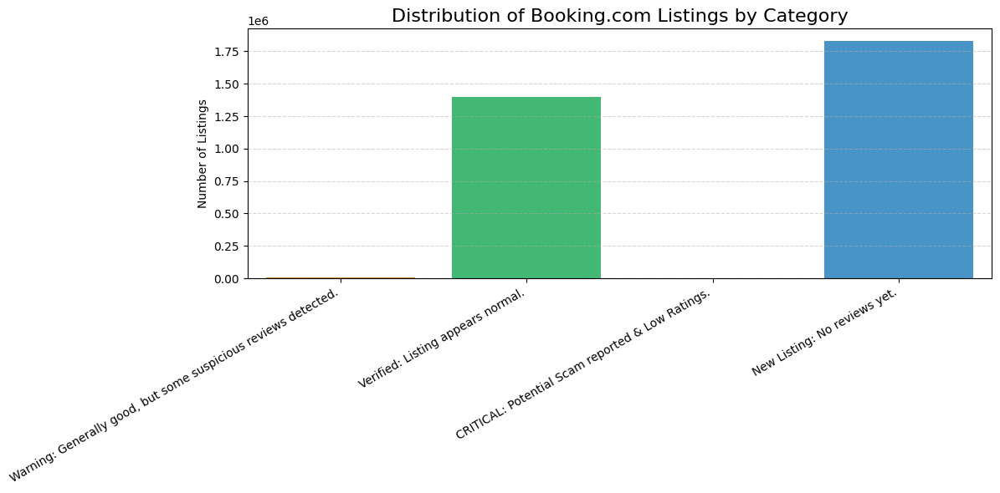

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. PREPARE DATA
alert_counts = booking_safety.groupBy("safety_alert").count().toPandas()

# 2. PLOT
plt.figure(figsize=(12, 6))

# Colors
palette = {
    "Verified: Listing appears normal.": "#2ecc71",       
    "CRITICAL: Potential Scam reported & Low Ratings.": "#e74c3c",     
    "Warning: Generally good, but some suspicious reviews detected.": "#f39c12", 
    "New Listing: No reviews yet.": "#3498db",            
    "Info: Active listing but Rating Missing.": "#95a5a6" 
}

# Create Bar Plot
# We remove 'hue' to simplify, but even if it appears, the next line kills the legend
sns.barplot(data=alert_counts, x="safety_alert", y="count", palette=palette)

# --- THE FIX: FORCE REMOVE LEGEND ---
plt.legend([],[], frameon=False)
# ------------------------------------

# Styling
plt.title("Distribution of Booking.com Listings by Category", fontsize=16)
plt.ylabel("Number of Listings")
plt.xlabel("") 

# Rotation
plt.xticks(rotation=30, ha='right', fontsize=10)

# Add grid
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [0]:
booking_final = booking_safety
display(booking_final.limit(10))

availability city coordinates country description fine_print hotel_id house_rules images location managed_by manager_language_spoken manager_score metro_railway_access most_popular_facilities number_of_reviews popular_facilities property_highlights property_information property_surroundings review_score reviews_scores title top_reviews url rating_norm flag_no_reviews flag_suspicious_text safety_alert List(List(1 king bed, null, 2, One-Bedroom Apartment)) Vrindāvan List(27.5737379354334, 77.6546632927292) India Featuring a garden, Mero vrindavan Luxury aavas features accommodations in Vrindāvan. This property offers access to a terrace, free private parking, and free Wifi.

This apartment will provide guests with 1 bedroom, a flat-screen TV, and air conditioning. The apartment also includes 1 bathroom.

Bharatpur Train Station is 31 miles from the apartment, while Mathura Train Station is 9 miles from the property. Agra Airport is 41 miles away. This property does not accommodate bachelor(ette) or similar parties. 12919785 List(List(From 12:00 PM to 11:00 PM You need to let the property know what time you'll be arriving in advance., Check-in), List(From 8:00 AM to 11:00 AM, Check-out), List(Cancellation and prepayment policies vary according to accommodation type. Enter your stay dates and check the conditions of your selected option., Cancellation/ prepayment), List(Child policies Children of all ages are welcome. To see correct prices and occupancy info, add the number and ages of children in your group to your search. Crib and extra bed policies Cribs and extra beds aren't available at this property., Children & Beds), List(There's no age requirement for check-in, No age restriction), List(Smoking is not allowed., Smoking), List(Parties/events are not allowed, Parties), List(Free! Pets are allowed. No extra charges., Pets)) List(https://cf.bstatic.com/xdata/images/hotel/max200/603653035.jpg?k=389f38be85031d2743f99b2fa6dfb9057557c739a921c74399ef5a0ef2d13edd&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653144.jpg?k=f363b0b79f3a6cd34c0deea79fe914db2e9ff4de19718324c9984c473167f21c&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653114.jpg?k=d1db0a18879b81d88ced90184f7baf3d69a655690cb52845fcc66c4734ab1135&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653103.jpg?k=b4196fc9b98950240db78d9648f8c8f88cedad19a0421c8c2c09a056bda0b214&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653086.jpg?k=c947befcb2f56d906e33488fe3bf63dc93a7902d037e2a8e36b8f87dc782261b&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653112.jpg?k=5e4ac49a4cd1ebfceb59314e1c81e80b115250e34a7f8f2784998ea924831857&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653083.jpg?k=ea5c5f07e22411dbe5a8efe3b38d2186907f87c4d6a7b59e4225902920d7e57b&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653080.jpg?k=1a8ad31134e2089042228673eb427c58b040904707917123325d70b8e70bbeb4&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653068.jpg?k=e398c11b34fa5dc518938f033b9234c55b024a0857fa0ff7954399ed1968975f&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653075.jpg?k=d64617957b2a3a2aa8038da09e33c7502bad000c06fea6f2580d4d4ec61931d6&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653077.jpg?k=6e8a8110d71315753c82807a0983eff2cd53c2073abd818f8cec72e646fb2d87&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653088.jpg?k=b2410bbebbf7e7747d63e1eb371676d2b7c142886e49d764bb2eca8ff22ad1b4&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653093.jpg?k=01e8307caea449129657723dd6674cc021f583ec1df15e1bd56aac26ddbee099&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653098.jpg?k=2941324ca574eccb9e3d0eea87e5d46d8151d66b6753ff4fcefd4cdb53203ff7&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653107.jpg?k=2030818f224ee99b97e139e3f0bc79778dd21f32204ae3618fdb13ae7dbac145&o=, https://cf.bstatic.com/xdata/images/hotel/max200/603653119.jpg?k=c46bd7884d30ab675cb06330515457f6d56f47bae3ffbc616e449913cae680

##### Transfering to delta table

In [0]:
# 1. Define the name of your table here
AIRBNB_TABLE = "airbnb_data_cleaned_raquel" 

# Use 'airbnb_final' directly
print(f"Saving results to Delta table: {AIRBNB_TABLE}...")

# Write the existing Spark DataFrame to the table
airbnb_final.write.format("delta").mode("overwrite").saveAsTable(AIRBNB_TABLE)

print(f"Saved results to table: {AIRBNB_TABLE}")

# Display result
display(spark.table(AIRBNB_TABLE))

Saving results to Delta table: airbnb_data_cleaned_raquel...
Saved results to table: airbnb_data_cleaned_raquel


name image description category availability discount reviews seller_info breadcrumbs location pets_allowed description_items category_rating house_rules details highlights arrangement_details amenities images available_dates url final_url listing_title property_id listing_name location_details description_by_sections description_html location_details_html is_supperhost host_rating hosts_year host_response_rate is_guest_favorite travel_details pricing_details currency cancellation_policy country postcode_map_url host_image host_details price total_price host_number_of_reviews property_number_of_reviews guests ratings lat long flag_no_reviews flag_suspicious_text flag_bad_price safety_alert Condo in Tirana · ★4.90 · 1 bedroom · 3 beds · 1 bath https://a0.muscache.com/pictures/miso/Hosting-1000038439969597100/original/cf8e65b3-2e9f-47d6-a6e4-3f143688e4a1.jpeg Urban Elegance in the Heart of the City!Welcome to our chic 1-bedroom apartment with breathtaking skyline views through floor-to-ceiling windows. Perched high above the city, this contemporary space features brand-new furnishings for a luxurious urban escape. Just a 10-minute walk from New Bazaar and 20 mins from Skanderbeg Square, you'll enjoy trendy shops, restaurants, and vibrant nightlife right at your doorstep. Perfect for business or leisure, experience the ultimate city living with us!The spaceOur apartment is bathed in natural light throughout the day, thanks to a glass facade with huge windows, creating bright and airy rooms. Enjoy the comfort of individual air conditioner units in each room, ensuring a pleasant stay year-round. Stays true null ["We were very happy with Gerta and the apartment. Everything worked. We could take hot showers without losing hot water. We loved the clothes dryer. Bus stops were all around, or we could walk to our destination. We felt safe being out, even at night. The view from the window was exciting: to the mountains, the city life, and the sunsets!","Didn’t actually get to stay here due to the fact that I got a last minute message from Gerta to say that the previous guests had broken parts of the home. Gerta was however very responsive despite the initial confusion in the beginning. Other than this, nothing bad to say. Really good response times.","Nice apartment with dedicated workspace, well decorated and equipped. We had everything we needed. Communication with Gerta and Esli was great as well! They gave us local recommendations on food and museums. We loved our stay there. Thank you, guys!","This apartment was brand new and very clean! Gerta was very helpful and responsive. My favourite part was the great city views and dedicated workstation. Thanks a lot guys!","Great place","My wife and I had a fantastic stay at this apartment. The place was spotless, stylish, and welcoming. The living area was spacious, the kitchen well-equipped, and the bedroom quite comfortable. Our host, Gerta was very helpful and friendly, waiting for us at the building.","Good location, perfect place nice view 🙏👍🏻","Beautiful view, city center within walking distance.","I'll be back again. Everything's perfect. Thank you for everything 🙏","Great place good location"] {"seller_id":"199917033","url":"https://www.airbnb.com/users/show/199917033"} Tiranë, Tirana County, Albania Tiranë, Tirana County, Albania false ["Entire condo","3 beds","1 bath"] [{"name":"Cleanliness","value":"4.9"},{"name":"Accuracy","value":"4.8"},{"name":"Check-in","value":"4.7"},{"name":"Communication","value":"4.9"},{"name":"Location","value":"5.0"},{"name":"Value","value":"4.9"}] ["Check-in: 2:00 PM - 8:00 PM","Checkout before 10:00 AM","4 guests maximum"] ["4 guests","1 bedroom","3 beds","1 bath"] [{"name":"Unbeatable location","value":"100% of guests in the past year gave this location a 5-star rating."},{"name":"Mountain and city views","value":"Soak up the views during your stay."},{"name":"Dedicated workspace","value":"A room with wifi that’s well-suited for working."}] [{"name"

In [0]:
# Enable support for spaces and special characters in column names
spark.conf.set("spark.databricks.delta.properties.defaults.columnMapping.mode", "name")

print("Column mapping enabled. Retrying save...")

Column mapping enabled. Retrying save...


In [0]:
# 1. Define the name of your table here
BOOKING_TABLE = "booking_data_cleaned_raquel" 

# Use 'airbnb_final' directly
print(f"Saving results to Delta table: {BOOKING_TABLE}...")

# Write the existing Spark DataFrame to the table
booking_final.write.format("delta").mode("overwrite").saveAsTable(BOOKING_TABLE)

print(f"Saved results to table: {BOOKING_TABLE}")

# Display result
display(spark.table(BOOKING_TABLE))

Saving results to Delta table: booking_data_cleaned_raquel...
Saved results to table: booking_data_cleaned_raquel


availability city coordinates country description fine_print hotel_id house_rules images location managed_by manager_language_spoken manager_score metro_railway_access most_popular_facilities number_of_reviews popular_facilities property_highlights property_information property_surroundings review_score reviews_scores title top_reviews url rating_norm flag_no_reviews flag_suspicious_text safety_alert List(List(1 full bed | 2 twin beds, null, 4, Two-Bedroom Apartment)) Biebesheim List(49.7850875, 8.466807) Germany Residenz am Rhein 2 is located in Biebesheim, just 21 miles from Messel Pit and 26 miles from Mannheim National Theatre. The air-conditioned accommodation is 15 miles from Darmstadtium Congress Center. Free Wifi is available throughout the property and Darmstadt Central Station is 13 miles away.

This apartment includes 2 bedrooms, a living room and a flat-screen TV, an equipped kitchen with a dining area, and 1 bathroom with a shower and a washing machine. For added privacy, the accommodation features a private entrance.

University of Mannheim is 27 miles from the apartment, while Maimarkt Mannheim is 27 miles from the property. Frankfurt Airport is 24 miles away. This property does not accommodate bachelor(ette) or similar parties. 12431653 List(List(From 4:00 PM to 7:00 PM You need to let the property know what time you'll be arriving in advance., Check-in), List(Until 11:00 AM, Check-out), List(Cancellation and prepayment policies vary according to accommodation type. Enter your stay dates and check the conditions of your selected option., Cancellation/ prepayment), List(Child policies Children not allowed. Crib and extra bed policies Cribs and extra beds aren't available at this property., Children & Beds), List(There's no age requirement for check-in, No age restriction), List(Smoking is not allowed., Smoking), List(Parties/events are not allowed, Parties), List(Pets are not allowed., Pets)) List() Hügelstraße 45, 64584 Biebesheim, Germany null List(German, English) null true List(Free parking, Non-smoking rooms, Free Wifi, Free parking, Non-smoking rooms, Free Wifi) 1 List(null, null) Free parking. Non-smoking rooms. Free Wifi. Free parking. Non-smoking rooms. Free Wifi null List(List(1.061, km, Vogelpark Biebesheim), List(10.233, km, Lutherkirche), List(13.312, km, Erholungsgebiet Büttelborn), List(13.368, km, Historisches Rathaus Büttelborn), List(12.938, km, Kneipp-Anlage), List(12.615, km, Stadtpark Zwingenberg), List(13.471, km, Schießwiese), List(13.545, km, Naherholungsgebiet Oberwiesensee), List(13.592, km, Erlengrund)) 1.0 List(null, null) Residenz am Rhein 2 List() https://www.booking.com/hotel/de/residenz-am-rhein-2.html 0.5 false false Verified: Listing appears normal. List(List(1 full bed, 1 king bed | 2 twin beds, 1 futon bed | 1 queen bed | 1 full bed, null, 8, Villa)) Mougins List(43.6126145, 7.0025099) France Villa MasDeline is a recently renovated villa in Mougins where guests can make the most of its outdoor swimming pool, free bikes, and garden. This property offers access to a terrace and free private parking. Parfumerie Fragonard – The History Factory Grasse is 7.9 miles from the villa and Allianz Riviera Stadium is 17 miles away.

With free Wifi, this 4-bedroom villa features a flat-screen TV, a washing machine, and a fully equipped kitchen with a dishwasher and oven. Featuring air conditioning, this unit has a dressing room and a fireplace. The property has an outdoor dining area.

There is a coffee shop and bar.

For guests with children, the villa offers outdoor play equipment. If you'd like to discover the area, walking tours is possible in the surrounding area, and Villa MasDeline can arrange a car rental service.

Palais des Festivals et des Congrès is 5 miles from the accommodation, while Musee International de la Parfumerie is 7.7 miles from the property. Nice Côte d'Azur Airport is 14 miles away. This property does not accommodate bachelor(ette) or similar parties. This property